In [1]:
@time using Distributions
@time using StatsPlots
default(fmt=:png, colorbar=false, titlefontsize=10)
cg_inferno = cgrad(:inferno) 
cg_inferno_rescaled = cgrad(cg_inferno.colors, cg_inferno.values .^2)

function pvalue_mean(x̄, μ; σ=10, n=10)
    2ccdf(Normal(), abs((x̄-μ)/(σ/√n)))
end

function confint(x̄; α=0.05, σ=10, n=10)
    c = cquantile(Normal(), α/2)
    [x̄ - c*σ/√n, x̄ + c*σ/√n]
end

function acceptreg(μ; α=0.05, σ=10, n=10)
    c = cquantile(Normal(), α/2)
    [μ - c*σ/√n, μ + c*σ/√n]
end

@time plot(sin);

  3.287831 seconds (438.15 k allocations: 28.584 MiB, 0.76% gc time, 0.51% compilation time)
  4.810599 seconds (1.44 M allocations: 82.870 MiB, 2.64% gc time, 0.56% compilation time: 68% of which was recompilation)
  0.885749 seconds (1.45 M allocations: 95.990 MiB, 7.35% gc time, 99.56% compilation time: 59% of which was recompilation)


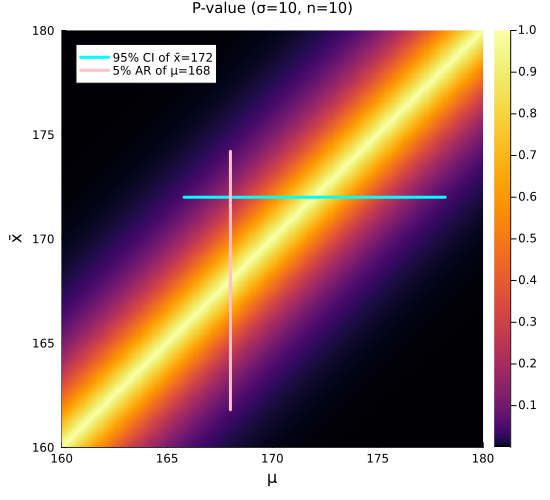

In [2]:
σ, n = 10, 10
α = 0.05
μs = range(160, 180, 400)
x̄s = range(160, 180, 400)
x̄ = 172
μ = 168
ci = confint(x̄; α, σ, n)
ar = acceptreg(μ; α, σ, n)

heatmap(μs, x̄s, (μ, x̄) -> pvalue_mean(x̄, μ; σ, n),
    c=cg_inferno_rescaled, colorbar=true)
plot!(ci, fill(x̄, 2); label="95% CI of x̄=$x̄", c=:cyan, lw=3)
plot!(fill(μ, 2), ar; label="5% AR of μ=$μ", c=:pink, lw=3)
plot!(xguide="μ", yguide="x̄", title="P-value (σ=$σ, n=$n)")
plot!(xlim=extrema(μs), ylim=extrema(x̄s))
plot!(size=(550, 500))

[ Info: Saved animation to D:\OneDrive\public\0048\pvalue_mean.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0048\\pvalue_mean.gif")
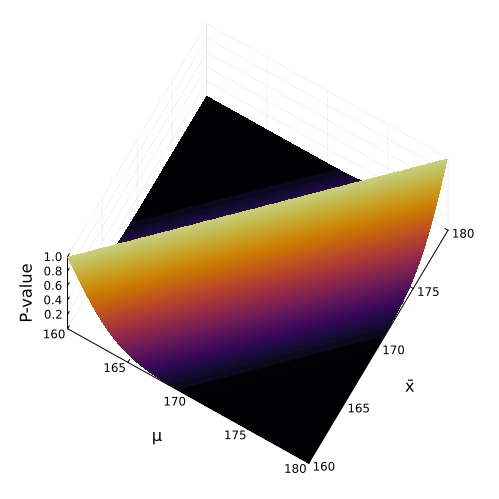

In [3]:
σ, n = 10, 10
μs = range(160, 180, 400)
x̄s = range(160, 180, 400)
anim = @animate for t in 0:359
    z = pvalue_mean.(x̄s, μs'; σ, n)
    surface(μs, x̄s, z; mz = .√z, camera = (30+t, 75),
        c=cg_inferno_rescaled)
    plot!(xguide="μ", yguide="x̄", zguide="P-value")
    plot!(size=(500, 500), margin=-10Plots.mm)
end
gif(anim, "pvalue_mean.gif")